# Wind Damage Function Testing

Tests `compute_wind_damage` from `build_wind_damage_profiles.py`.

**Equation 2.3.1** (Ren. Energy 2012, doi:10.1016/j.renene.2012.01.012):
- V_e = V_p × 1.2 (extreme wind speed from 10 m gust V_p)
- F_D = 0 if V_e ≤ 25 m/s
- F_D = 0.0002·V_e² − 0.0031·V_e − 0.0494 if 25 < V_e < 75 m/s
- F_D = 1 if V_e ≥ 75 m/s

## Imports and paths

In [1]:
import sys
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd

import atlite


root = Path.cwd()
pypsa_eur_root = root.parent.parent  # scripts/_testing/ → scripts/ → pypsa-eur/
build_dmg_dir = pypsa_eur_root / "scripts" / "build_damage_profiles"
sys.path.insert(0, str(build_dmg_dir))

from build_wind_damage_profiles import compute_wind_damage, aggregate_to_buses

print("Imports OK")

Imports OK


In [2]:
SCENARIO_DIR = pypsa_eur_root / "resources/2022-BE/weather_year_2022_win_cap"
CUTOUT_DIR   = pypsa_eur_root / "data/cutout/build/unknown"

# AVAIL_PATH   = SCENARIO_DIR / "availability_matrix_5_onwind.nc"
# PROFILE_PATH = SCENARIO_DIR / "profile_5_onwind.nc"
# DMG_PATH     = SCENARIO_DIR / "damage_profiles" / "onwind_damage_5.nc"
# TURBINE_NAME = "Vestas_V112_3MW"

# AVAIL_PATH   = SCENARIO_DIR / "availability_matrix_5_offwind-ac.nc"
# PROFILE_PATH = SCENARIO_DIR / "profile_5_offwind-ac.nc"
# DMG_PATH = SCENARIO_DIR / "damage_profiles" / "offwind-ac_damage_5.nc"
# TURBINE_NAME = "NREL_ReferenceTurbine_2020ATB_5.5MW"

# AVAIL_PATH   = SCENARIO_DIR / "availability_matrix_5_offwind-dc.nc"
# PROFILE_PATH = SCENARIO_DIR / "profile_5_offwind-dc.nc"
# DMG_PATH     = SCENARIO_DIR / "damage_profiles" / "offwind-dc_damage_5.nc"
# TURBINE_NAME = "NREL_ReferenceTurbine_2020ATB_5.5MW"

AVAIL_PATH   = SCENARIO_DIR / "availability_matrix_5_offwind-float.nc"
PROFILE_PATH = SCENARIO_DIR / "profile_5_offwind-float.nc"
DMG_PATH     = SCENARIO_DIR / "damage_profiles" / "offwind-float_damage_5.nc"
TURBINE_NAME = "NREL_ReferenceTurbine_5MW_offshore"

CARRIERS = {
    "onwind":        ("availability_matrix_5_onwind.nc",        "Vestas_V112_3MW"),
    "offwind-ac":    ("availability_matrix_5_offwind-ac.nc",    "NREL_ReferenceTurbine_2020ATB_5.5MW"),
    "offwind-dc":    ("availability_matrix_5_offwind-dc.nc",    "NREL_ReferenceTurbine_2020ATB_5.5MW"),
    "offwind-float": ("availability_matrix_5_offwind-float.nc", "NREL_ReferenceTurbine_5MW_offshore"),
}

# Snapshot window for weather_year_2022_win_cap (Jun 2022 – May 2023)
SNAP_START = "2022-06-01"
SNAP_END   = "2023-05-31 23:00"


## 1. Boundary value checks

Expected behaviour:
- V_p ≤ 20.833 m/s → V_e ≤ 25 → F_D = 0
- V_p = 62.5 m/s → V_e = 75 → F_D = 1
- V_p > 62.5 m/s → V_e > 75 → F_D = 1

In [3]:
test_V_p = xr.DataArray(
    [0.0, 20.0, 20.833, 21.0, 25.0, 40.0, 62.5, 75.0, 90.0],
    dims=["v"],
    attrs={"units": "m/s"},
)

V_e = test_V_p * 1.2
F_D = compute_wind_damage(test_V_p)

print(f"{'V_p (m/s)':>12}  {'V_e (m/s)':>12}  {'F_D':>8}")
print("-" * 38)
for vp, ve, fd in zip(test_V_p.values, V_e.values, F_D.values):
    print(f"{vp:>12.3f}  {ve:>12.3f}  {fd:>8.5f}")

# V_p = 21.0 → V_e = 25.2, inside the formerly-negative band — must be 0
assert F_D.sel(v=3).item() == 0.0, "F_D must not be negative just above threshold"

   V_p (m/s)     V_e (m/s)       F_D
--------------------------------------
       0.000         0.000   0.00000
      20.000        24.000   0.00000
      20.833        25.000   0.00000
      21.000        25.200   0.00000
      25.000        30.000   0.03760
      40.000        48.000   0.26260
      62.500        75.000   1.00000
      75.000        90.000   1.00000
      90.000       108.000   1.00000


## 2. F_D curve — damage fraction vs extreme wind speed V_e

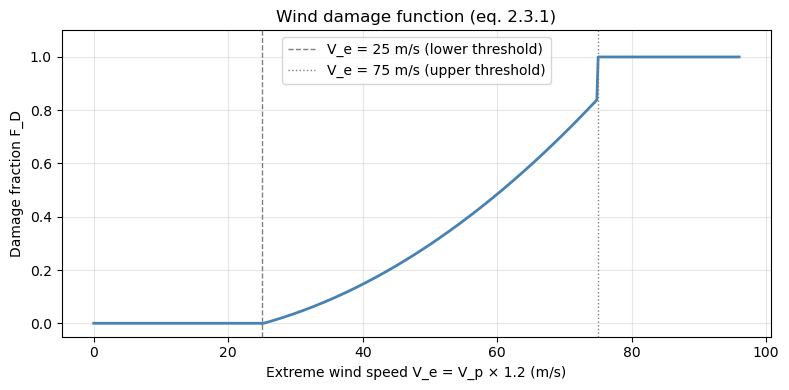

In [3]:
V_p_range = xr.DataArray(np.linspace(0, 80, 500), dims=["v"])
F_D_range = compute_wind_damage(V_p_range)
V_e_range = V_p_range * 1.2

fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(V_e_range.values, F_D_range.values, color="steelblue", linewidth=2)
ax.axvline(25, color="gray", linestyle="--", linewidth=1, label="V_e = 25 m/s (lower threshold)")
ax.axvline(75, color="gray", linestyle=":", linewidth=1, label="V_e = 75 m/s (upper threshold)")
ax.set_xlabel("Extreme wind speed V_e = V_p × 1.2 (m/s)")
ax.set_ylabel("Damage fraction F_D")
ax.set_title("Wind damage function (eq. 2.3.1)")
ax.set_ylim(-0.05, 1.1)
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## 3. Test with a synthetic 2D grid (mimics cutout structure)

In [4]:
rng = np.random.default_rng(42)

# Synthetic gust grid: (time=24h, y=10, x=10), values roughly 10–70 m/s
n_time, ny, nx = 24, 10, 10
V_p_grid = xr.DataArray(
    rng.uniform(10, 70, size=(n_time, ny, nx)),
    dims=["time", "y", "x"],
    coords={
        "time": np.arange(n_time),
        "y": np.linspace(46, 56, ny),
        "x": np.linspace(4, 15, nx),
    },
)

F_D_grid = compute_wind_damage(V_p_grid)

print(f"F_D_grid shape : {F_D_grid.shape}")
print(f"F_D range      : [{float(F_D_grid.min()):.4f}, {float(F_D_grid.max()):.4f}]")
print(f"F_D mean       : {float(F_D_grid.mean()):.4f}")

F_D_grid shape : (24, 10, 10)
F_D range      : [0.0000, 1.0000]
F_D mean       : 0.3578


## 4. Test `aggregate_to_buses` with synthetic availability matrix

In [5]:
buses = ["BE0 0", "BE0 1", "BE0 2"]

# Synthetic availability: each bus covers a different region of the grid
avail_data = np.zeros((len(buses), ny, nx))
avail_data[0, :5, :5] = rng.uniform(0, 0.4, size=(5, 5))   # top-left
avail_data[1, :5, 5:] = rng.uniform(0, 0.4, size=(5, 5))   # top-right
avail_data[2, 5:, :] = rng.uniform(0, 0.4, size=(5, nx))   # bottom

availability = xr.DataArray(
    avail_data,
    dims=["bus", "y", "x"],
    coords={
        "bus": buses,
        "y": V_p_grid.y,
        "x": V_p_grid.x,
    },
)

CF_mean_synth = xr.DataArray(
    rng.uniform(0.1, 0.5, size=(ny, nx)),
    dims=["y", "x"], coords={"y": V_p_grid.y, "x": V_p_grid.x},
)
area_synth = xr.DataArray(
    np.full((ny, nx), 600.0),
    dims=["y", "x"], coords={"y": V_p_grid.y, "x": V_p_grid.x},
)

F_D_bus = aggregate_to_buses(F_D_grid, CF_mean_synth, area_synth, availability)

operational = 1.0 - F_D_bus

print(f"F_D_bus shape  : {F_D_bus.shape}")
print(f"F_D_bus dims   : {F_D_bus.dims}")
print()
print(f"{'Bus':<10}  {'Mean F_D':>10}  {'Mean operational':>18}")
print("-" * 42)
for bus in buses:
    fd = float(F_D_bus.sel(bus=bus).mean())
    op = float(operational.sel(bus=bus).mean())
    print(f"{bus:<10}  {fd:>10.4f}  {op:>18.4f}")

F_D_bus shape  : (24, 3)
F_D_bus dims   : ('time', 'bus')

Bus           Mean F_D    Mean operational
------------------------------------------
BE0 0           0.3656              0.6344
BE0 1           0.3307              0.6693
BE0 2           0.3563              0.6437


In [11]:
CF_mean_synth

<xarray.DataArray (y: 10, x: 10)> Size: 800B
array([[0.49929139, 0.29698517, 0.12452163, 0.33834318, 0.14760966,
        0.19790602, 0.23151196, 0.39241195, 0.17352325, 0.16630118],
       [0.1179857 , 0.44929597, 0.37740217, 0.11597859, 0.11131692,
        0.32346972, 0.21301376, 0.33869054, 0.27384167, 0.46932502],
       [0.21512361, 0.37165815, 0.12162172, 0.48234421, 0.49230299,
        0.39562985, 0.28608499, 0.18799738, 0.42500654, 0.39454164],
       [0.18878162, 0.28048612, 0.28511958, 0.43056422, 0.37353787,
        0.35726702, 0.35993097, 0.20818803, 0.2486845 , 0.11826491],
       [0.41477645, 0.27319929, 0.27529534, 0.19814251, 0.18377091,
        0.33512877, 0.19302121, 0.12568354, 0.40700297, 0.25058777],
       [0.25209423, 0.27252731, 0.42601793, 0.22833476, 0.40321448,
        0.47581794, 0.36434728, 0.27267243, 0.39911589, 0.28315895],
       [0.26577091, 0.31011327, 0.22708893, 0.14170009, 0.2659408 ,
        0.14954275, 0.26417659, 0.32277349, 0.47228447, 0.11448893],
       [0.34858336, 0.28309407, 0.10810445, 0.19981927, 0.1473941 ,
        0.18671766, 0.2098281 , 0.26052253, 0.31161576, 0.100396  ],
       [0.16474774, 0.13742655, 0.31986936, 0.23162995, 0.31935909,
        0.18872932, 0.10969174, 0.47654676, 0.14332325, 0.1507435 ],
       [0.15861873, 0.49251061, 0.3470641 , 0.34411598, 0.49467928,
        0.13537551, 0.48980036, 0.18160526, 0.3492286 , 0.26803343]])
Coordinates:
  * y        (y) float64 80B 46.0 47.11 48.22 49.33 ... 52.67 53.78 54.89 56.0
  * x        (x) float64 80B 4.0 5.222 6.444 7.667 ... 11.33 12.56 13.78 15.0

In [12]:
area_synth

<xarray.DataArray (y: 10, x: 10)> Size: 800B
array([[600., 600., 600., 600., 600., 600., 600., 600., 600., 600.],
       [600., 600., 600., 600., 600., 600., 600., 600., 600., 600.],
       [600., 600., 600., 600., 600., 600., 600., 600., 600., 600.],
       [600., 600., 600., 600., 600., 600., 600., 600., 600., 600.],
       [600., 600., 600., 600., 600., 600., 600., 600., 600., 600.],
       [600., 600., 600., 600., 600., 600., 600., 600., 600., 600.],
       [600., 600., 600., 600., 600., 600., 600., 600., 600., 600.],
       [600., 600., 600., 600., 600., 600., 600., 600., 600., 600.],
       [600., 600., 600., 600., 600., 600., 600., 600., 600., 600.],
       [600., 600., 600., 600., 600., 600., 600., 600., 600., 600.]])
Coordinates:
  * y        (y) float64 80B 46.0 47.11 48.22 49.33 ... 52.67 53.78 54.89 56.0
  * x        (x) float64 80B 4.0 5.222 6.444 7.667 ... 11.33 12.56 13.78 15.0

In [10]:
availability

<xarray.DataArray (bus: 3, y: 10, x: 10)> Size: 2kB
array([[[0.27550089, 0.21309617, 0.15514561, 0.32491878, 0.28382336,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.18736213, 0.35699373, 0.09197921, 0.0681566 , 0.25712151,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.38879774, 0.09890263, 0.09986815, 0.05579954, 0.34422542,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.09055902, 0.20127141, 0.39634899, 0.00485636, 0.22259444,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.20491562, 0.32297895, 0.14211262, 0.16413654, 0.06717519,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ]],
...
       [[0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.09011894, 0.2896049 , 0.33495339, 0.03231415, 0.35283108,
         0.31900688, 0.34787372, 0.27937142, 0.26966123, 0.21003729],
        [0.26111489, 0.36764387, 0.0402088 , 0.12630579, 0.02898199,
         0.37792207, 0.17810619, 0.27013779, 0.33644803, 0.3964001 ],
        [0.06471298, 0.31980504, 0.35496916, 0.01955015, 0.30163622,
         0.14189013, 0.25943872, 0.20561928, 0.1038969 , 0.05408854],
        [0.04677889, 0.04132914, 0.25511602, 0.14056434, 0.08665338,
         0.27675404, 0.27473983, 0.21566732, 0.37398313, 0.15416569],
        [0.33434519, 0.03005576, 0.29593244, 0.39537897, 0.33863929,
         0.23186589, 0.25070643, 0.14131582, 0.27179409, 0.30815815]]])
Coordinates:
  * bus      (bus) <U5 60B 'BE0 0' 'BE0 1' 'BE0 2'
  * y        (y) float64 80B 46.0 47.11 48.22 49.33 ... 52.67 53.78 54.89 56.0
  * x        (x) float64 80B 4.0 5.222 6.444 7.667 ... 11.33 12.56 13.78 15.0

## 5. Plot operational profile per bus over time

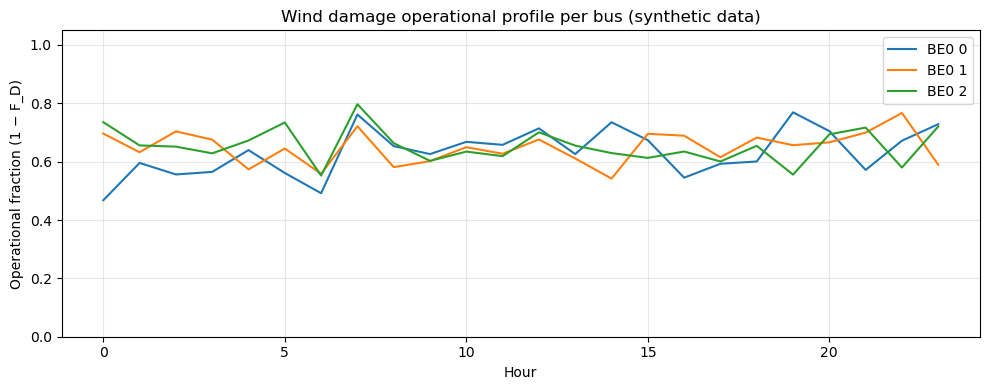

In [13]:
fig, ax = plt.subplots(figsize=(10, 4))
for bus in buses:
    ax.plot(operational.sel(bus=bus).values, label=bus)
ax.set_xlabel("Hour")
ax.set_ylabel("Operational fraction (1 − F_D)")
ax.set_title("Wind damage operational profile per bus (synthetic data)")
ax.set_ylim(0, 1.05)
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## Load gust data

In [6]:

snapshot_index = pd.date_range(start=SNAP_START, end=SNAP_END, freq="h", inclusive="both")
GUST_CACHE = CUTOUT_DIR / "wnd_gust10m_2022-06_2023-05.nc"

if GUST_CACHE.exists():
    V_p = xr.open_dataarray(GUST_CACHE)
    print(f"Loaded from cache: {GUST_CACHE}")
else:
    cutout_2022 = atlite.Cutout(CUTOUT_DIR / "europe-2022-era5_fg10_lmlt.nc")
    cutout_2023 = atlite.Cutout(CUTOUT_DIR / "europe-2023-era5_fg10_lmlt.nc")
    V_p_2022 = cutout_2022.data["wnd_gust10m"].sel(time=slice("2022-06-01", "2022-12-31 23:00"))
    V_p_2023 = cutout_2023.data["wnd_gust10m"].sel(time=slice("2023-01-01", "2023-05-31 23:00"))
    V_p = xr.concat([V_p_2022, V_p_2023], dim="time")
    V_p.to_netcdf(GUST_CACHE)
    print(f"Saved to cache: {GUST_CACHE}")


Loaded from cache: /home/lois/pypsa-eur/pypsa-eur/data/cutout/build/unknown/wnd_gust10m_2022-06_2023-05.nc


/tmp/ipykernel_387263/841059851.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab10")


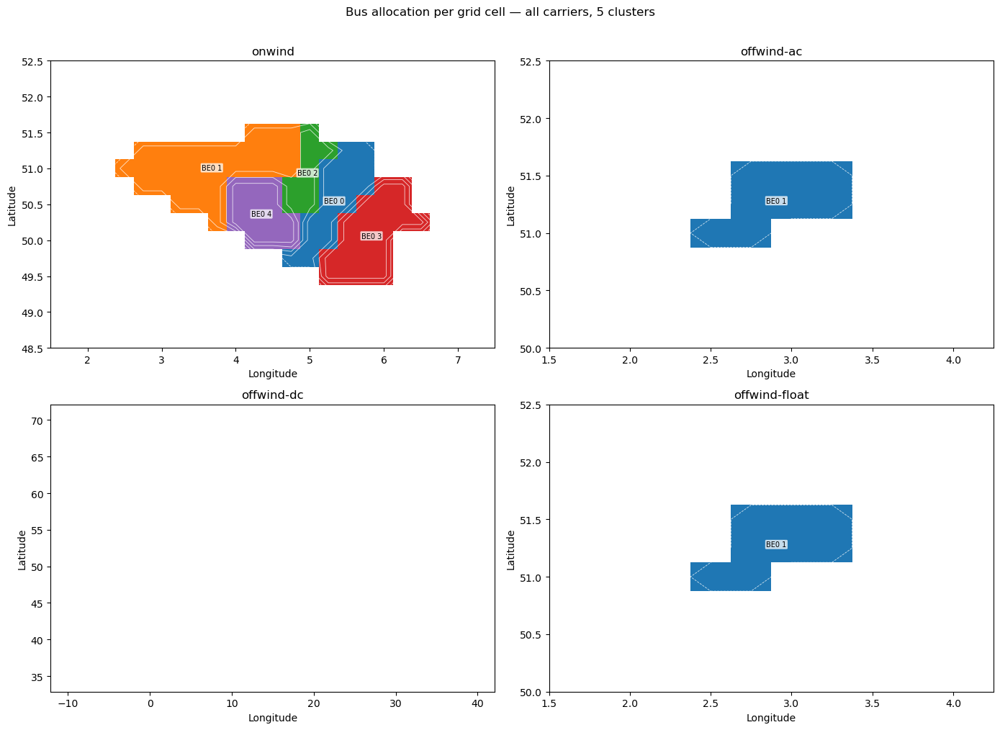

In [7]:
cutout_2022 = atlite.Cutout(CUTOUT_DIR / "europe-2022-era5_fg10_lmlt.nc")
cmap = plt.cm.get_cmap("tab10")

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

for ax, (carrier, (avail_file, turbine)) in zip(axes.flat, CARRIERS.items()):
    avail = xr.open_dataarray(SCENARIO_DIR / avail_file)
    avail_total = avail.sum(dim="bus")
    has_avail = avail_total > 0

    # Colour each cell by dominant bus index
    dom_bus = avail.argmax(dim="bus").where(has_avail).astype(float)
    dom_bus.plot(ax=ax, cmap="tab10", vmin=0, vmax=9, add_colorbar=False)

    # Bus region borders via contour on the integer bus index array
    dom_int = avail.argmax(dim="bus").where(has_avail, other=-1)
    ax.contour(
        dom_int.x.values, dom_int.y.values, dom_int.values,
        levels=np.arange(-0.5, len(avail.bus) + 0.5, 1),
        colors="white", linewidths=0.6, alpha=0.8,
    )

    # Bus label at centroid of each region
    for i, bus in enumerate(avail.bus.values):
        mask = (avail.argmax(dim="bus") == i) & has_avail
        if mask.any():
            y_c = float(avail.y.where(mask).mean())
            x_c = float(avail.x.where(mask).mean())
            ax.text(x_c, y_c, bus, fontsize=7, ha="center", va="center",
                    bbox=dict(boxstyle="round,pad=0.15", facecolor="white", alpha=0.75, edgecolor="none"))

    # Zoom to active cells
    x_act = avail.x.where(has_avail.any(dim="y"), drop=True)
    y_act = avail.y.where(has_avail.any(dim="x"), drop=True)
    if len(x_act) and len(y_act):
        ax.set_xlim(float(x_act.min()) - 1, float(x_act.max()) + 1)
        ax.set_ylim(float(y_act.min()) - 1, float(y_act.max()) + 1)

    ax.set_title(carrier)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

plt.suptitle("Bus allocation per grid cell — all carriers, 5 clusters", y=1.01)
plt.tight_layout()
plt.show()


In [8]:
## 6. Load real cutout data and compute layout weights — grid maps (all carriers)

CARRIERS = {
    "onwind":        ("availability_matrix_5_onwind.nc",        "Vestas_V112_3MW"),
    "offwind-ac":    ("availability_matrix_5_offwind-ac.nc",    "NREL_ReferenceTurbine_2020ATB_5.5MW"),
    "offwind-dc":    ("availability_matrix_5_offwind-dc.nc",    "NREL_ReferenceTurbine_2020ATB_5.5MW"),
    "offwind-float": ("availability_matrix_5_offwind-float.nc", "NREL_ReferenceTurbine_5MW_offshore"),
}

cutout_2022 = atlite.Cutout(CUTOUT_DIR / "europe-2022-era5_fg10_lmlt.nc")
area = cutout_2022.area(crs=3035) / 1e6
peak_gust = V_p.max(dim="time")

# Pass 1: collect per-carrier bounds
lon_mins, lon_maxs, lat_mins, lat_maxs = [], [], [], []
for avail_file, _ in CARRIERS.values():
    avail = xr.open_dataarray(SCENARIO_DIR / avail_file)
    has_avail = avail.sum(dim="bus") > 0
    x_act = avail.x.where(has_avail.any(dim="y"), drop=True)
    y_act = avail.y.where(has_avail.any(dim="x"), drop=True)
    lon_mins.append(float(x_act.min()) - 1)
    lon_maxs.append(float(x_act.max()) + 1)
    lat_mins.append(float(y_act.min()) - 1)
    lat_maxs.append(float(y_act.max()) + 1)

lon_min, lon_max = min(lon_mins), max(lon_maxs)
lat_min, lat_max = min(lat_mins), max(lat_maxs)

# Pass 2: plot
for carrier, (avail_file, turbine) in CARRIERS.items():
    CF_mean      = cutout_2022.wind(turbine=turbine, capacity_factor=True)
    availability = xr.open_dataarray(SCENARIO_DIR / avail_file)
    avail_total  = availability.sum(dim="bus")
    layout_weight = CF_mean * area * avail_total
    layout_weight = layout_weight / layout_weight.max()

    fig, axes = plt.subplots(2, 2, figsize=(14, 9))

    CF_mean.plot(ax=axes[0, 0], cmap="YlOrRd", add_colorbar=True)
    axes[0, 0].set_title("CF mean (time-average per cell)")

    avail_total.plot(ax=axes[0, 1], cmap="Blues", add_colorbar=True)
    axes[0, 1].set_title("Availability (summed over buses)")

    layout_weight.plot(ax=axes[1, 0], cmap="Greens", add_colorbar=True)
    axes[1, 0].set_title("Layout weight CF × area × avail (normalised)")

    peak_gust.plot(ax=axes[1, 1], cmap="Purples", add_colorbar=True)
    axes[1, 1].set_title("Peak gust Jun 2022 – May 2023 (m/s)")

    for ax in axes.flat:
        ax.set_xlim(lon_min, lon_max)
        ax.set_ylim(lat_min, lat_max)
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")

    plt.suptitle(f"Spatial weighting check — {carrier}, 5 clusters", y=1.01)
    plt.tight_layout()
    plt.show()


ValueError: numpy.nanmin raises on a.size==0 and axis=None; So Bottleneck too.

In [14]:
cf_profile

<xarray.DataArray 'profile' (year: 1, time: 8760, bus: 1, bin: 1)> Size: 70kB
[8760 values with dtype=float64]
Coordinates:
  * year     (year) int64 8B 0
  * bus      (bus) <U5 20B 'BE0 1'
  * bin      (bin) int64 8B 0
  * time     (time) datetime64[ns] 70kB 2022-06-01 ... 2023-05-31T23:00:00

In [15]:
op_existing.sel(bus=BUS).to_series().head(10)


time
2022-06-01 00:00:00    0.0
2022-06-01 01:00:00    0.0
2022-06-01 02:00:00    0.0
2022-06-01 03:00:00    0.0
2022-06-01 04:00:00    0.0
2022-06-01 05:00:00    0.0
2022-06-01 06:00:00    0.0
2022-06-01 07:00:00    0.0
2022-06-01 08:00:00    0.0
2022-06-01 09:00:00    0.0
Name: profile, dtype: float64

In [ ]:
## 8. Plot — damage events vs renewable CF profile
CARRIER = "offwind-ac"
# onwind | offwind-ac | offwind-dc | offwind-float
BUS = "BE0 1"

_avail_file, TURBINE_NAME = CARRIERS[CARRIER]
AVAIL_PATH   = SCENARIO_DIR / _avail_file
PROFILE_PATH = SCENARIO_DIR / f"profile_5_{CARRIER}.nc"
DMG_PATH     = SCENARIO_DIR / "damage_profiles" / f"{CARRIER}_damage_5.nc"

op_existing = xr.open_dataset(DMG_PATH)["profile"]
cf_profile  = xr.open_dataset(PROFILE_PATH)["profile"]

fig, axes = plt.subplots(2, 1, figsize=(14, 6), sharex=True)

axes[0].plot(1 - op_existing.time.values, op_existing.sel(bus=BUS).values,
             color="steelblue", linewidth=0.8, label="damage factor (1\u2212F_D)")
axes[0].set_ylabel("Operational fraction")
axes[0].set_ylim(0.0, 1.01)
axes[0].legend()
axes[0].set_title(f"Wind damage vs renewable CF \u2014 {BUS}")

axes[1].plot(cf_profile.time.values, cf_profile.sel(bus=BUS).squeeze().values,
             color="darkorange", linewidth=0.8, label="renewable CF profile")

axes[1].set_ylabel("Capacity factor")
axes[1].set_xlabel("Time")
axes[1].legend()

plt.tight_layout()
plt.show()


In [10]:
from atlite.resource import get_windturbineconfig


In [18]:
## Cell-level validation — Jan–May 2023

from atlite.resource import get_windturbineconfig

# Load 2023 damage cutout and select time window
cutout_2023 = atlite.Cutout(CUTOUT_DIR / "europe-2023-era5_fg10_lmlt.nc")
time_window = slice("2023-01-01", "2023-05-31 23:00")
ds_2023 = cutout_2023.data.sel(time=time_window)
avail_mask = availability.max(dim="bus") > 0
V_p_max_masked = ds_2023["wnd_gust10m"].max(dim="time").where(avail_mask)

arr = V_p_max_masked.values
iy, ix = np.unravel_index(np.nanargmax(arr), arr.shape)
best_y = float(V_p_max_masked.y.values[iy])
best_x = float(V_p_max_masked.x.values[ix])
print(f"Highest-gust {carrier} cell: y={best_y}, x={best_x}, peak gust: {arr[iy, ix]:.2f} m/s")



Highest-gust offwind-float cell: y=51.5, x=2.75, peak gust: 25.94 m/s


In [19]:
# Compute hub-height wind speed at cell
turbine    = get_windturbineconfig(TURBINE_NAME, add_cutout_windspeed=True)
hub_height = turbine["hub_height"]
V          = np.array(turbine["V"])
POW        = np.array(turbine["POW"])
P          = float(turbine["P"])
cf_values  = POW / P

wnd100m   = ds_2023["wnd100m"].sel(y=best_y, x=best_x)
roughness = ds_2023["roughness"].sel(y=best_y, x=best_x)
wnd_hub   = wnd100m * np.log(hub_height / roughness) / np.log(100.0 / roughness)

# Cell-level CF and damage
CF_cell  = np.interp(wnd_hub.values, V, cf_values)
V_p_cell = ds_2023["wnd_gust10m"].sel(y=best_y, x=best_x)
F_D_cell = compute_wind_damage(V_p_cell).values

time_vals = ds_2023.time.values


In [21]:
## Cell-level validation — set carrier here
CARRIER = "offwind-ac"  
# onwind | offwind-ac | offwind-dc | offwind-float

_avail_file, _turbine = CARRIERS[CARRIER]
_avail_path   = SCENARIO_DIR / _avail_file
_profile_path = SCENARIO_DIR / f"profile_5_{CARRIER}.nc"
_dmg_path     = SCENARIO_DIR / "damage_profiles" / f"{CARRIER}_damage_5.nc"

# Re-derive best cell for this carrier's availability mask
availability  = xr.open_dataarray(_avail_path)
time_window   = slice("2023-01-01", "2023-05-31 23:00")
cutout_2023   = atlite.Cutout(CUTOUT_DIR / "europe-2023-era5_fg10_lmlt.nc")
ds_2023       = cutout_2023.data.sel(time=time_window)

avail_mask        = availability.max(dim="bus") > 0
V_p_max_masked    = ds_2023["wnd_gust10m"].max(dim="time").where(avail_mask)
arr               = V_p_max_masked.values
iy, ix            = np.unravel_index(np.nanargmax(arr), arr.shape)
best_y, best_x    = float(V_p_max_masked.y.values[iy]), float(V_p_max_masked.x.values[ix])
print(f"Highest-gust {CARRIER} cell: y={best_y}, x={best_x}, peak gust: {arr[iy, ix]:.2f} m/s")

# Hub-height wind and cell CF
turbine_cfg = get_windturbineconfig(_turbine, add_cutout_windspeed=True)
hub_height  = turbine_cfg["hub_height"]
V           = np.array(turbine_cfg["V"])
cf_values   = np.array(turbine_cfg["POW"]) / float(turbine_cfg["P"])

wnd100m   = ds_2023["wnd100m"].sel(y=best_y, x=best_x)
roughness = ds_2023["roughness"].sel(y=best_y, x=best_x)
wnd_hub   = wnd100m * np.log(hub_height / roughness) / np.log(100.0 / roughness)
CF_cell   = np.interp(wnd_hub.values, V, cf_values)
V_p_cell  = ds_2023["wnd_gust10m"].sel(y=best_y, x=best_x)
F_D_cell  = compute_wind_damage(V_p_cell).values
time_vals = ds_2023.time.values

# Dominant bus
avail_at_cell = availability.sel(y=best_y, x=best_x)
bus = str(avail_at_cell.bus[avail_at_cell.argmax(dim="bus")].values)
print(f"Dominant bus: {bus}  (availability weight: {float(avail_at_cell.max()):.4f})")

op_existing = xr.open_dataset(_dmg_path)["profile"].sel(bus=bus, time=time_window)
cf_profile  = xr.open_dataset(_profile_path)["profile"].sel(bus=bus, time=time_window).squeeze()

fig, axes = plt.subplots(4, 1, figsize=(14, 10), sharex=True)

axes[0].plot(time_vals, wnd_hub.values, color="steelblue", linewidth=0.8)
axes[0].axhline(25, color="red", linestyle="--", linewidth=1, label="cut-out 25 m/s")
axes[0].set_ylabel("Hub-height wind (m/s)")
axes[0].legend(fontsize=8)

axes[1].plot(time_vals, CF_cell, color="steelblue", linewidth=0.8, label="cell CF")
axes[1].plot(cf_profile.time.values, cf_profile.values,
             color="darkorange", linewidth=0.8, linestyle="--", label=f"bus CF ({bus})")
axes[1].set_ylabel("Capacity factor")
axes[1].legend(fontsize=8)

axes[2].plot(time_vals, V_p_cell.values, color="purple", linewidth=0.8)
axes[2].axhline(25 / 1.2, color="red", linestyle="--", linewidth=1,
                label=f"damage onset ({25/1.2:.1f} m/s)")
axes[2].set_ylabel("10 m gust (m/s)")
axes[2].legend(fontsize=8)

axes[3].plot(time_vals, 1 - F_D_cell, color="steelblue", linewidth=0.8, label="cell 1−F_D")
axes[3].plot(op_existing.time.values, op_existing.values,
             color="darkorange", linewidth=0.8, linestyle="--", label=f"bus damage profile ({bus})")
axes[3].set_ylabel("Operational fraction")
axes[3].set_ylim(0.0, 1.01)
axes[3].set_xlabel("Time")
axes[3].legend(fontsize=8)

fig.suptitle(f"Cell-level validation — {CARRIER}, y={best_y}, x={best_x}  (dominant bus: {bus}), Jan–May 2023")
plt.tight_layout()
plt.show()


Highest-gust offwind-ac cell: y=51.5, x=2.75, peak gust: 25.94 m/s


: 

Highest-gust offwind-dc cell: y=48.75, x=-5.25, peak gust: 33.13 m/s
Dominant bus: FR0 4  (availability weight: 0.0819)


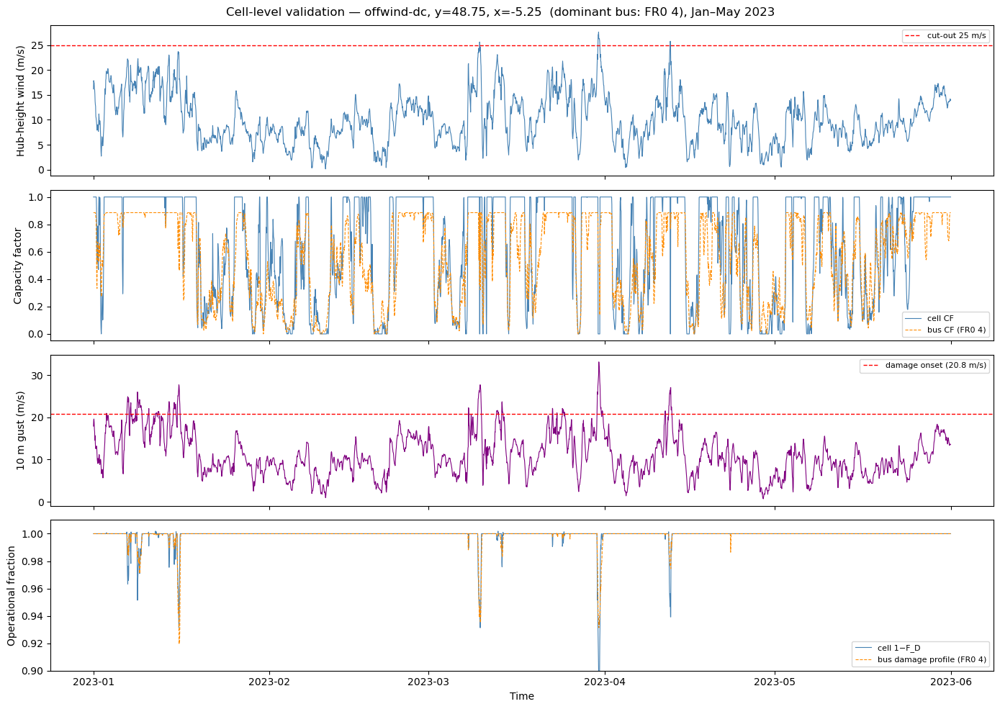

In [13]:
## Cell-level validation — set carrier here
CARRIER = "offwind-dc"  
# onwind | offwind-ac | offwind-dc | offwind-float

_avail_file, _turbine = CARRIERS[CARRIER]
_avail_path   = SCENARIO_DIR / _avail_file
_profile_path = SCENARIO_DIR / f"profile_5_{CARRIER}.nc"
_dmg_path     = SCENARIO_DIR / "damage_profiles" / f"{CARRIER}_damage_5.nc"

# Re-derive best cell for this carrier's availability mask
availability  = xr.open_dataarray(_avail_path)
time_window   = slice("2023-01-01", "2023-05-31 23:00")
cutout_2023   = atlite.Cutout(CUTOUT_DIR / "europe-2023-era5_fg10_lmlt.nc")
ds_2023       = cutout_2023.data.sel(time=time_window)

avail_mask        = availability.max(dim="bus") > 0
V_p_max_masked    = ds_2023["wnd_gust10m"].max(dim="time").where(avail_mask)
arr               = V_p_max_masked.values
iy, ix            = np.unravel_index(np.nanargmax(arr), arr.shape)
best_y, best_x    = float(V_p_max_masked.y.values[iy]), float(V_p_max_masked.x.values[ix])
print(f"Highest-gust {CARRIER} cell: y={best_y}, x={best_x}, peak gust: {arr[iy, ix]:.2f} m/s")

# Hub-height wind and cell CF
turbine_cfg = get_windturbineconfig(_turbine, add_cutout_windspeed=True)
hub_height  = turbine_cfg["hub_height"]
V           = np.array(turbine_cfg["V"])
cf_values   = np.array(turbine_cfg["POW"]) / float(turbine_cfg["P"])

wnd100m   = ds_2023["wnd100m"].sel(y=best_y, x=best_x)
roughness = ds_2023["roughness"].sel(y=best_y, x=best_x)
wnd_hub   = wnd100m * np.log(hub_height / roughness) / np.log(100.0 / roughness)
CF_cell   = np.interp(wnd_hub.values, V, cf_values)
V_p_cell  = ds_2023["wnd_gust10m"].sel(y=best_y, x=best_x)
F_D_cell  = compute_wind_damage(V_p_cell).values
time_vals = ds_2023.time.values

# Dominant bus
avail_at_cell = availability.sel(y=best_y, x=best_x)
bus = str(avail_at_cell.bus[avail_at_cell.argmax(dim="bus")].values)
print(f"Dominant bus: {bus}  (availability weight: {float(avail_at_cell.max()):.4f})")

op_existing = xr.open_dataset(_dmg_path)["profile"].sel(bus=bus, time=time_window)
cf_profile  = xr.open_dataset(_profile_path)["profile"].sel(bus=bus, time=time_window).squeeze()

fig, axes = plt.subplots(4, 1, figsize=(14, 10), sharex=True)

axes[0].plot(time_vals, wnd_hub.values, color="steelblue", linewidth=0.8)
axes[0].axhline(25, color="red", linestyle="--", linewidth=1, label="cut-out 25 m/s")
axes[0].set_ylabel("Hub-height wind (m/s)")
axes[0].legend(fontsize=8)

axes[1].plot(time_vals, CF_cell, color="steelblue", linewidth=0.8, label="cell CF")
axes[1].plot(cf_profile.time.values, cf_profile.values,
             color="darkorange", linewidth=0.8, linestyle="--", label=f"bus CF ({bus})")
axes[1].set_ylabel("Capacity factor")
axes[1].legend(fontsize=8)

axes[2].plot(time_vals, V_p_cell.values, color="purple", linewidth=0.8)
axes[2].axhline(25 / 1.2, color="red", linestyle="--", linewidth=1,
                label=f"damage onset ({25/1.2:.1f} m/s)")
axes[2].set_ylabel("10 m gust (m/s)")
axes[2].legend(fontsize=8)

axes[3].plot(time_vals, 1 - F_D_cell, color="steelblue", linewidth=0.8, label="cell 1−F_D")
axes[3].plot(op_existing.time.values, op_existing.values,
             color="darkorange", linewidth=0.8, linestyle="--", label=f"bus damage profile ({bus})")
axes[3].set_ylabel("Operational fraction")
axes[3].set_ylim(0.9, 1.01)
axes[3].set_xlabel("Time")
axes[3].legend(fontsize=8)

fig.suptitle(f"Cell-level validation — {CARRIER}, y={best_y}, x={best_x}  (dominant bus: {bus}), Jan–May 2023")
plt.tight_layout()
plt.show()


Highest-gust onwind cell: y=42.0, x=9.0, peak gust: 39.10 m/s
Dominant bus: FR0 3  (availability weight: 0.8412)


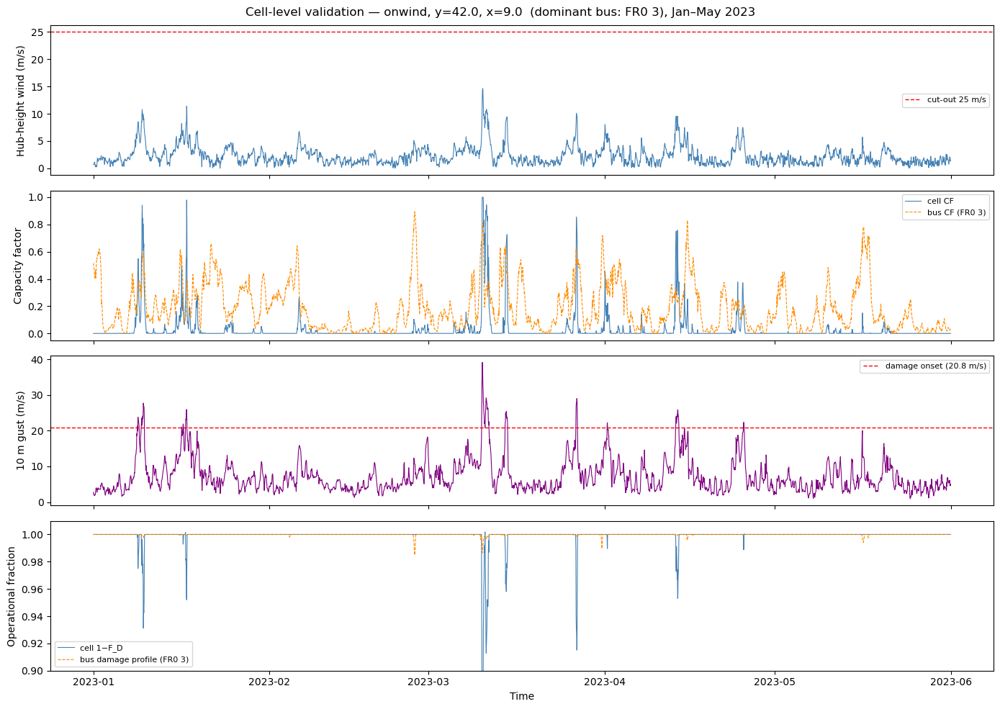

In [14]:
## Cell-level validation — set carrier here
CARRIER = "onwind"  
# onwind | offwind-ac | offwind-dc | offwind-float

_avail_file, _turbine = CARRIERS[CARRIER]
_avail_path   = SCENARIO_DIR / _avail_file
_profile_path = SCENARIO_DIR / f"profile_5_{CARRIER}.nc"
_dmg_path     = SCENARIO_DIR / "damage_profiles" / f"{CARRIER}_damage_5.nc"

# Re-derive best cell for this carrier's availability mask
availability  = xr.open_dataarray(_avail_path)
time_window   = slice("2023-01-01", "2023-05-31 23:00")
cutout_2023   = atlite.Cutout(CUTOUT_DIR / "europe-2023-era5_fg10_lmlt.nc")
ds_2023       = cutout_2023.data.sel(time=time_window)

avail_mask        = availability.max(dim="bus") > 0
V_p_max_masked    = ds_2023["wnd_gust10m"].max(dim="time").where(avail_mask)
arr               = V_p_max_masked.values
iy, ix            = np.unravel_index(np.nanargmax(arr), arr.shape)
best_y, best_x    = float(V_p_max_masked.y.values[iy]), float(V_p_max_masked.x.values[ix])
print(f"Highest-gust {CARRIER} cell: y={best_y}, x={best_x}, peak gust: {arr[iy, ix]:.2f} m/s")

# Hub-height wind and cell CF
turbine_cfg = get_windturbineconfig(_turbine, add_cutout_windspeed=True)
hub_height  = turbine_cfg["hub_height"]
V           = np.array(turbine_cfg["V"])
cf_values   = np.array(turbine_cfg["POW"]) / float(turbine_cfg["P"])

wnd100m   = ds_2023["wnd100m"].sel(y=best_y, x=best_x)
roughness = ds_2023["roughness"].sel(y=best_y, x=best_x)
wnd_hub   = wnd100m * np.log(hub_height / roughness) / np.log(100.0 / roughness)
CF_cell   = np.interp(wnd_hub.values, V, cf_values)
V_p_cell  = ds_2023["wnd_gust10m"].sel(y=best_y, x=best_x)
F_D_cell  = compute_wind_damage(V_p_cell).values
time_vals = ds_2023.time.values

# Dominant bus
avail_at_cell = availability.sel(y=best_y, x=best_x)
bus = str(avail_at_cell.bus[avail_at_cell.argmax(dim="bus")].values)
print(f"Dominant bus: {bus}  (availability weight: {float(avail_at_cell.max()):.4f})")

op_existing = xr.open_dataset(_dmg_path)["profile"].sel(bus=bus, time=time_window)
cf_profile  = xr.open_dataset(_profile_path)["profile"].sel(bus=bus, time=time_window).squeeze()

fig, axes = plt.subplots(4, 1, figsize=(14, 10), sharex=True)

axes[0].plot(time_vals, wnd_hub.values, color="steelblue", linewidth=0.8)
axes[0].axhline(25, color="red", linestyle="--", linewidth=1, label="cut-out 25 m/s")
axes[0].set_ylabel("Hub-height wind (m/s)")
axes[0].legend(fontsize=8)

axes[1].plot(time_vals, CF_cell, color="steelblue", linewidth=0.8, label="cell CF")
axes[1].plot(cf_profile.time.values, cf_profile.values,
             color="darkorange", linewidth=0.8, linestyle="--", label=f"bus CF ({bus})")
axes[1].set_ylabel("Capacity factor")
axes[1].legend(fontsize=8)

axes[2].plot(time_vals, V_p_cell.values, color="purple", linewidth=0.8)
axes[2].axhline(25 / 1.2, color="red", linestyle="--", linewidth=1,
                label=f"damage onset ({25/1.2:.1f} m/s)")
axes[2].set_ylabel("10 m gust (m/s)")
axes[2].legend(fontsize=8)

axes[3].plot(time_vals, 1 - F_D_cell, color="steelblue", linewidth=0.8, label="cell 1−F_D")
axes[3].plot(op_existing.time.values, op_existing.values,
             color="darkorange", linewidth=0.8, linestyle="--", label=f"bus damage profile ({bus})")
axes[3].set_ylabel("Operational fraction")
axes[3].set_ylim(0.9, 1.01)
axes[3].set_xlabel("Time")
axes[3].legend(fontsize=8)

fig.suptitle(f"Cell-level validation — {CARRIER}, y={best_y}, x={best_x}  (dominant bus: {bus}), Jan–May 2023")
plt.tight_layout()
plt.show()


---
## Network-level comparison: p_max_pu and CF (wind damage scenarios)

Loads the solved  networks and uses the existing
 helpers to compare base vs damaged-dispatch  and overlay
actual capacity factors.

In [30]:
import pypsa
import sys
from plot_network import iplot_p_max_pu, iplot_cf_pmax
from builders import build_p_max_pu_df, build_cf_pmax_df

WIN_DIS_DIR = pypsa_eur_root / "results/FR-weather_years+dmg/weather_year_2022_win_dis/networks"
n_base = pypsa.Network(WIN_DIS_DIR / "base_s_5_elec_.nc")
n_dmg  = pypsa.Network(WIN_DIS_DIR / "base_s_5_elec__damaged-dispatch.nc")

NETWORKS      = {"base": n_base, "damaged": n_dmg}
WIND_CARRIERS = ["onwind", "offwind-ac", "offwind-dc"]

INFO:pypsa.network.io:New version 1.2.0 available! (Current: 1.0.7)
INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores, sub_networks
INFO:pypsa.network.io:New version 1.2.0 available! (Current: 1.0.7)
INFO:pypsa.network.io:Imported network 'Unnamed Network' has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores, sub_networks


### p_max_pu — all carriers, fleet-average per scenario

In [45]:
# Fleet-weighted average p_max_pu per carrier across all buses
iplot_p_max_pu(build_p_max_pu_df(NETWORKS, carriers=WIND_CARRIERS, by_bus=False))

### p_max_pu — split by bus

In [46]:
for carrier in WIND_CARRIERS:
    fig = iplot_p_max_pu(build_p_max_pu_df(NETWORKS, carriers=[carrier], by_bus=True))
    fig.update_layout(title=carrier)
    fig.show()

### CF vs p_max_pu overlay

One plot per (carrier, bus) combination. In the damaged network  already
incorporates the damage factor, so divergence between the two scenarios is the wind damage signal.

In [31]:
nc = pypsa.NetworkCollection([n_base, n_dmg], index=["base", "damaged"])
ts = nc.statistics.capacity_factor(
    groupby=["bus", "carrier"], groupby_time=False, nice_names=False
)


In [38]:
nc.statistics.supply(groupby=["carrier"], nice_names=False)

component    network  carrier        
Generator    base     biomass            3.573827e+05
                      nuclear            1.280291e+08
                      offwind-ac         1.185313e+07
                      offwind-dc         9.891477e+06
                      offwind-float      1.033201e+02
                      onwind             8.872311e+07
                      solar              2.599809e+08
                      solar-hsat         4.781124e+02
             damaged  biomass            3.752198e+05
                      load_shedding      4.526528e+05
                      nuclear            1.302985e+08
                      offwind-ac         1.137005e+07
                      offwind-dc         9.882986e+06
                      offwind-float      1.553314e+02
                      onwind             8.995512e+07
                      solar              2.602500e+08
                      solar-hsat         6.315152e+02
Line         base     AC                 1.6

In [41]:
nc.statistics.capacity_factor(groupby=["carrier"], nice_names=False)

component    network  carrier        
Generator    base     biomass            0.161893
                      nuclear            0.279770
                      offwind-ac         0.447422
                      offwind-dc         0.507818
                      offwind-float      0.195945
                      onwind             0.249079
                      solar              0.145401
                      solar-hsat         0.115041
             damaged  biomass            0.169973
                      load_shedding      0.004381
                      nuclear            0.284729
                      offwind-ac         0.429187
                      offwind-dc         0.507382
                      offwind-float      0.294665
                      onwind             0.252537
                      solar              0.145552
                      solar-hsat         0.151948
Line         base     AC                 0.226457
             damaged  AC                 0.196787
Link        

In [40]:
WIND_CARRIERS

['onwind', 'offwind-ac', 'offwind-dc']

In [44]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from styles import _DAMAGE_COLORS

cf     = nc.statistics.capacity_factor(groupby=["carrier"], nice_names=False)
supply = nc.statistics.supply(groupby=["carrier"], nice_names=False)

cf_wind     = cf.loc["Generator"].loc[pd.IndexSlice[:, WIND_CARRIERS]].unstack(level=0)
supply_wind = supply.loc["Generator"].loc[pd.IndexSlice[:, WIND_CARRIERS]].unstack(level=0)

network_colors = {net: _DAMAGE_COLORS[i % len(_DAMAGE_COLORS)] for i, net in enumerate(cf_wind.columns)}

fig = make_subplots(rows=1, cols=2, subplot_titles=["Capacity factor", "Supply (MWh)"])

for network in cf_wind.columns:
    color = network_colors[network]
    fig.add_trace(go.Bar(name=network, x=cf_wind.index, y=cf_wind[network],
                         marker_color=color, showlegend=True), row=1, col=1)
    fig.add_trace(go.Bar(name=network, x=supply_wind.index, y=supply_wind[network],
                         marker_color=color, showlegend=False), row=1, col=2)

fig.update_layout(barmode="group", title="Wind: base vs damaged-dispatch")
fig.update_yaxes(range=[0, 1], row=1, col=1)
fig.show()


In [33]:
ts = nc.statistics.capacity_factor(
    groupby=["bus", "carrier"], groupby_time=True, nice_names=False
)


AssertionError: 

In [ ]:
import plotly.graph_objects as go

ts_carrier = nc.statistics.capacity_factor(
    groupby=["carrier"], groupby_time=False, nice_names=False
)

fig = go.Figure()
for (network, carrier), row in ts_carrier.loc["Generator"].iterrows():
    if carrier not in WIND_CARRIERS:
        continue
    s = row.copy()
    s.index = pd.to_datetime(s.index)
    fig.add_trace(go.Scatter(
        x=s.index, y=s.values,
        name=f"{network} | {carrier}",
        mode="lines", line=dict(width=1),
        connectgaps=False,
    ))

fig.update_layout(
    hovermode="x unified",
    yaxis=dict(range=[0, 1], title="Capacity factor"),
    xaxis_title="snapshot",
    title="Wind CF: base vs damaged-dispatch",
)
fig.show()


In [ ]:
for carrier in WIND_CARRIERS:
    buses = sorted(n_base.generators[n_base.generators.carrier == carrier].bus.unique())
    for bus in buses:
        fig = iplot_cf_pmax(build_cf_pmax_df(ts, NETWORKS, bus=bus, carrier=carrier))
        fig.show()

In [ ]:
import plotly.express as px

cf_mean = (
    ts.loc["Generator"]
    .loc[pd.IndexSlice[:, :, WIND_CARRIERS]]
    .mean(axis=1)
    .rename("cf_mean")
    .reset_index()
)
cf_mean.columns = ["network", "bus", "carrier", "cf_mean"]

fig = px.bar(
    cf_mean.groupby(["network", "carrier"], as_index=False)["cf_mean"].mean(),
    x="carrier", y="cf_mean", color="network",
    barmode="group",
    title="Mean capacity factor: base vs damaged-dispatch",
    labels={"cf_mean": "Mean CF", "carrier": "Carrier"},
)
fig.update_yaxes(range=[0, 1])
fig.show()
